## **Import packages for analysis**

In [1]:
import sys
sys.path.insert(0, '/home/tchari/monod/src/')

In [2]:
# import monod
# from monod import preprocess, extract_data, cme_toolbox, inference, analysis

import monod
from monod.preprocess import *
from monod.extract_data import extract_data
import monod.cme_toolbox as cme_toolbox
from monod.cme_toolbox import CMEModel
import monod.inference as inference
from monod.inference import InferenceParameters, GradientInference
import monod.analysis as analysis
from monod.analysis import *


In [3]:
import pandas as pd
import numpy as np
import loompy as lp
import matplotlib.pyplot as plt
import scipy
import seaborn as sns
import scipy.stats
import os



In [4]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

## **Read in data and metadata**

In [17]:
#Degradation rates from paper Cao et al. 2020
meta_path = "/home/tchari/metadata/"
meta = pd.read_csv(meta_path+'cao_GSM3770930_A549_cell_annotate.txt',header=0)
meta['sample'] = ['sci-A549:'+i+'.bam' for i in meta['sample']]
meta.head()

,sample,all_exon,all_intron,all_reads,treatment_time,doublet_score
0,sci-A549:sci-A549-001.ACTCTCTCAA.bam,31785.0,6225.0,41737.0,4h,0.107050
1,sci-A549:sci-A549-001.AAGAAGTTCA.bam,31194.0,2514.0,36264.0,6h,0.036959
2,sci-A549:sci-A549-001.ACGGAGAATA.bam,17207.0,2270.0,21127.0,8h,0.044974
3,sci-A549:sci-A549-001.CGATCCTGGA.bam,14282.0,1932.0,17723.0,4h,0.037975
4,sci-A549:sci-A549-001.ACTGAATTCC.bam,32336.0,8779.0,44778.0,6h,0.077990


In [14]:
#Degradation rates from paper Cao et al. 2020
gammas = pd.read_csv(meta_path+'cao_NIHMS1573440-supplement-2.csv',header=1)
gammas.head()

,gene_id,gene_type,gene_short_name,half_life_hour
0,ENSG00000228463.4,lincRNA,AP006222.2,0.945733
1,ENSG00000230021.3,lincRNA,RP5-857K21.4,4.351820
2,ENSG00000225972.1,pseudogene,MTND1P23,2.235362
3,ENSG00000225630.1,pseudogene,MTND2P28,1.452221
4,ENSG00000237973.1,pseudogene,hsa-mir-6723,0.871835


In [40]:
ds = lp.connect('/home/tchari/counts/cao_scifate/loom/sci-A549.loom')

In [41]:
ds.ra.keys()

['Accession', 'Chromosome', 'End', 'Gene', 'Start', 'Strand']

In [42]:
ds.ca.keys()

['CellID']

In [43]:
cellids = ds.ca['CellID']

In [44]:
ds.close()

Set up files/output files for *Monod* runs

In [54]:
dataset_meta = ['sci-A549']
print('dataset_meta: ', dataset_meta)
print()

subcluster_names = [['0h'],['2h'],['0h','2h']] #Cells from treatment times to fit on

sub_names_only = ['_'.join(n) for n in subcluster_names]

cluster_names = []
dataset_names = ['cao_'+dataset_meta[0]+'_'+y  for y in sub_names_only]   #To save
print('dataset_names: ', dataset_names)
print('len(dataset_names): ',len(dataset_names))
print()

raw_data_locations = [dataset_meta[0] for y in sub_names_only]
transcriptome_filepath = '/home/tchari/perturbCME/notebooks/gg_200525_genome_polyA_cum_3' 

spliced_layer = 'spliced'
unspliced_layer = 'unspliced'
gene_attr = 'Gene'
cell_attr = 'CellID'

attribute_names=[(unspliced_layer,spliced_layer),gene_attr,cell_attr]

loom_filepaths = ['/home/tchari/counts/cao_scifate/loom/'+x+'.loom' for x in raw_data_locations] 
print('loom_filepaths: ',loom_filepaths)

n_datasets = len(loom_filepaths)

dataset_meta:  ['sci-A549']

dataset_names:  ['cao_sci-A549_0h', 'cao_sci-A549_2h', 'cao_sci-A549_0h_2h']
len(dataset_names):  3

loom_filepaths:  ['/home/tchari/counts/cao_scifate/loom/sci-A549.loom', '/home/tchari/counts/cao_scifate/loom/sci-A549.loom', '/home/tchari/counts/cao_scifate/loom/sci-A549.loom']


**Get boolean filter cell barcodes in loom for each timepoint**

In [55]:
cf = []
cellids = pd.Categorical(cellids)
for s in subcluster_names:
    cf.append(cellids.isin(list(meta['sample'][meta['treatment_time'].isin(s)])))

In [56]:
len(cf)

3

## **Gene Filtering**

Filter for moderately expressed genes across cells

In [50]:
import logging, sys
logging.basicConfig(stream=sys.stdout)
log = logging.getLogger()
log.setLevel(logging.INFO)

In [51]:
!mkdir ./fits

mkdir: cannot create directory ‘./fits’: File exists


Initially fit Monod on the timepoints to see which technical sampling parameters best fit (data was sequenced together).

Select high expression genes that are not very variable across samples for this fitting.

INFO:root:Beginning data preprocessing and filtering.
INFO:root:Directory ./fits/gg_240202_025_sampl__1 already exists.
INFO:root:Dataset: cao_sci-A549_0h
INFO:root:1151 cells detected.
INFO:root:63568 features observed, 37922 match genome annotations. 32005 were unique.
INFO:root:4048 genes retained after expression filter.
INFO:root:Directory ./fits/gg_240202_025_sampl__1/cao_sci-A549_0h created.
INFO:root:Dataset: cao_sci-A549_2h
INFO:root:1189 cells detected.
INFO:root:63568 features observed, 37922 match genome annotations. 32005 were unique.
INFO:root:4066 genes retained after expression filter.
INFO:root:Directory ./fits/gg_240202_025_sampl__1/cao_sci-A549_2h created.
INFO:root:Dataset: cao_sci-A549_0h_2h
INFO:root:2340 cells detected.
INFO:root:63568 features observed, 37922 match genome annotations. 32005 were unique.
INFO:root:4756 genes retained after expression filter.
INFO:root:Directory ./fits/gg_240202_025_sampl__1/cao_sci-A549_0h_2h created.
INFO:root:Total of 3000 gene

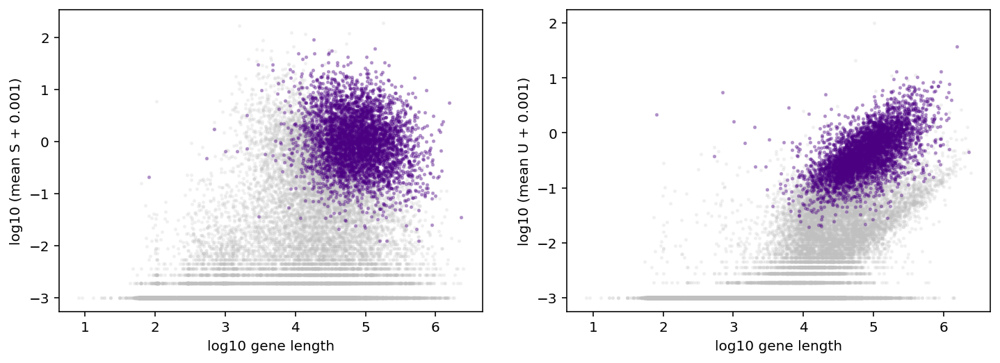

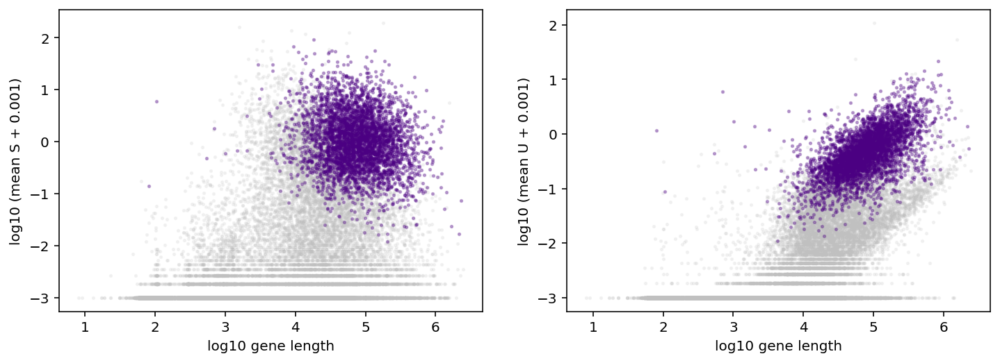

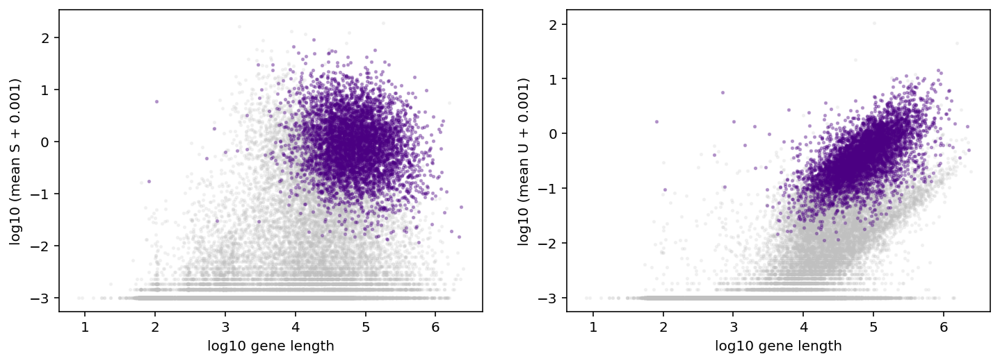

In [57]:
#Set the marker genes to be fit if possible
dir_string,dataset_strings = monod.preprocess.construct_batch(loom_filepaths, \
                                             transcriptome_filepath, \
                                             dataset_names, \
                                             attribute_names=attribute_names,\
                                             batch_location='./fits',meta='sampl_',batch_id=1,\
                                             n_genes=3000,exp_filter_threshold=None,cf=cf)

In [58]:
dir_string = './fits/gg_240202_025_sampl__1' #'./fits/gg_230303_025_germ_all_1'
dataset_strings = [dir_string+'/'+i for i in dataset_names]


In [59]:
print(dataset_strings)
print(len(dataset_strings))

['./fits/gg_240202_025_sampl__1/cao_sci-A549_0h', './fits/gg_240202_025_sampl__1/cao_sci-A549_2h', './fits/gg_240202_025_sampl__1/cao_sci-A549_0h_2h']
3


## **Run *Monod* Parameter Inference**
Running inference to fit technical sampling parameters. Should be similar since sequenced together.

In [62]:
#Define bounds
phys_lb = [-2.0, -1.8, -1.8 ] #-1.0, -1.8, -1.8
phys_ub = [4.2, 2.5, 2.5] #4.2, 2.5, 3.5
samp_lb = [-9, -4] #-7.5, -2
samp_ub = [-4, 1.5] #-5.5, 0
# gridsize = [5,6]
gridsize = [10,11] #20,21 #run across grid of technical/sampling parameters

In [63]:
print(len(dataset_strings))

3


INFO:root:Directory ./fits/gg_240202_025_sampl__1/cao_sci-A549_0h/Bursty_Poisson_10x11 already exists.
INFO:root:Global inference parameters stored to ./fits/gg_240202_025_sampl__1/cao_sci-A549_0h/Bursty_Poisson_10x11/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: cao_sci-A549_0h
INFO:root:63568 features observed, 37922 match genome annotations. 32005 were unique.
INFO:root:Gene list extracted from ./fits/gg_240202_025_sampl__1/genes.csv.
INFO:root:Directory ./fits/gg_240202_025_sampl__1/cao_sci-A549_0h/diagnostic_figures already exists.
INFO:root:Search data stored to ./fits/gg_240202_025_sampl__1/cao_sci-A549_0h/raw.sd.
INFO:root:Starting parallelized grid scan.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 110/110 [20:41<00:00, 11.28s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_240202_025_sampl__1/cao_sci-A549_0h/Bursty_Poisson_10x11/analysis_figures created.
INFO:root:Runtime: 1243.7 seconds.
INFO:root:Directory ./fits/gg_240202_025_sampl__1/cao_sci-A549_2h/Bursty_Poisson_10x11 created.
INFO:root:Global inference parameters stored to ./fits/gg_240202_025_sampl__1/cao_sci-A549_2h/Bursty_Poisson_10x11/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: cao_sci-A549_2h
INFO:root:63568 features observed, 37922 match genome annotations. 32005 were unique.
INFO:root:Gene list extracted from ./fits/gg_240202_025_sampl__1/genes.csv.
INFO:root:Directory ./fits/gg_240202_025_sampl__1/cao_sci-A549_2h/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_240202_025_sampl__1/cao_sci-A549_2h/raw.sd.
INFO:root:Starting parallelized grid scan.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 110/110 [22:23<00:00, 12.21s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_240202_025_sampl__1/cao_sci-A549_2h/Bursty_Poisson_10x11/analysis_figures created.
INFO:root:Runtime: 1345.6 seconds.
INFO:root:Directory ./fits/gg_240202_025_sampl__1/cao_sci-A549_0h_2h/Bursty_Poisson_10x11 created.
INFO:root:Global inference parameters stored to ./fits/gg_240202_025_sampl__1/cao_sci-A549_0h_2h/Bursty_Poisson_10x11/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: cao_sci-A549_0h_2h
INFO:root:63568 features observed, 37922 match genome annotations. 32005 were unique.
INFO:root:Gene list extracted from ./fits/gg_240202_025_sampl__1/genes.csv.
INFO:root:Directory ./fits/gg_240202_025_sampl__1/cao_sci-A549_0h_2h/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_240202_025_sampl__1/cao_sci-A549_0h_2h/raw.sd.
INFO:root:Starting parallelized grid scan.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 110/110 [25:58<00:00, 14.17s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_240202_025_sampl__1/cao_sci-A549_0h_2h/Bursty_Poisson_10x11/analysis_figures created.
INFO:root:Runtime: 1561.0 seconds.


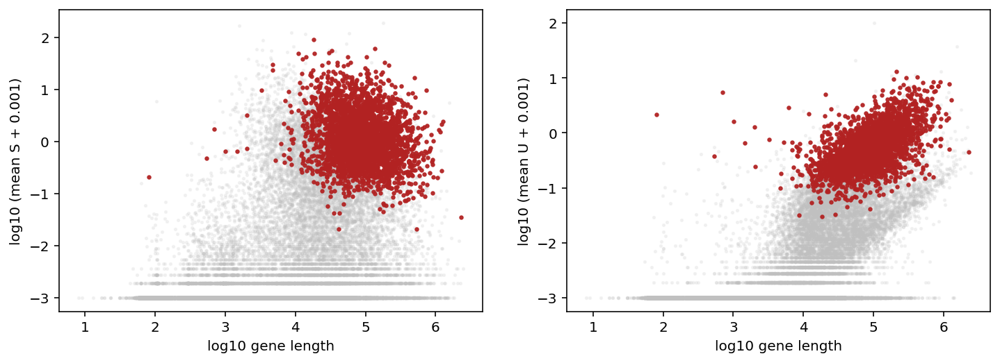

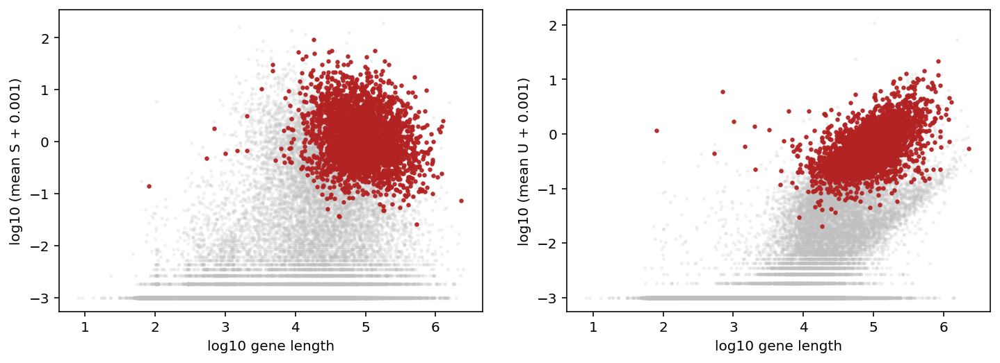

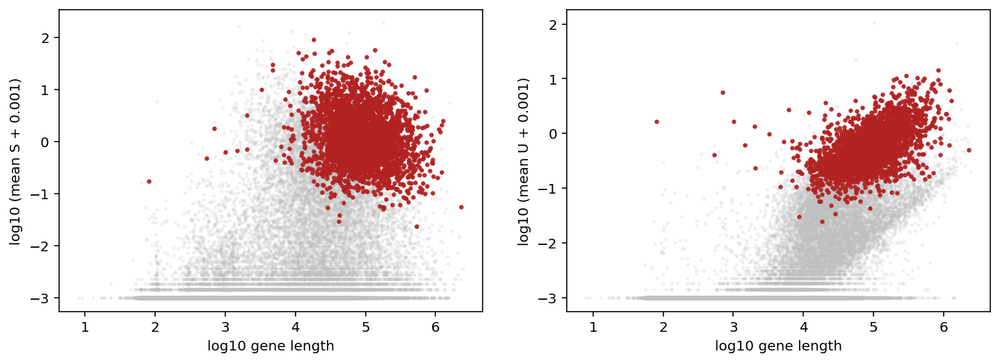

In [65]:
result_strings = []
for i in range(n_datasets): #Re-run datasets that were never fit, [7:]
    fitmodel = monod.cme_toolbox.CMEModel('Bursty','Poisson')
    inference_parameters = monod.inference.InferenceParameters(phys_lb,phys_ub,samp_lb,samp_ub,gridsize,\
                dataset_strings[i],fitmodel,use_lengths = True,
                gradient_params = {'max_iterations':20,'init_pattern':'moments','num_restarts':1})
    search_data = monod.extract_data.extract_data(loom_filepaths[i], transcriptome_filepath, dataset_names[i],
                dataset_strings[i], dir_string, dataset_attr_names=attribute_names,cf=cf[i])
    full_result_string = inference_parameters.fit_all_grid_points(30,search_data)

    result_strings.append(full_result_string)

In [ ]:
result_strings = [i+'/Bursty_Poisson_10x11/grid_scan_results.res' for i in dataset_strings] #20x21
print(result_strings[0])

## **QC and Analysis of Results**

In [21]:
n_datasets

16

INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/Bursty_Poisson_10x11/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/Bursty_Poisson_10x11/analysis_figures/kldiv.png.
INFO:root:Chi-square computation complete. Rejected 157 genes out of 3000. Runtime: 6.1 seconds.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/Bursty_Poisson_10x11/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/Bursty_Poisson_10x11/analysis_figures/subsampling_stability.png.
INFO:root:Original optimum: -6.78, -1.80.
INFO:root:Chi-square computation complete. Rejected 157 genes out of 3000. Runtime: 6.0 seconds.
INFO:root:New optimum: -6.78, -1.80.
IN

/home/tchari/monod/src/monod/inference.py:1370: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/Bursty_Poisson_10x11/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_10x11/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_T_E16/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_10x11/analysis_figures/kldiv.png.
INFO:root:Chi-square computation complete. Rejected 510 genes out of 3000. Runtime: 5.8 seconds.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_T_E16/Bur

/home/tchari/monod/src/monod/inference.py:1370: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4156: RuntimeWarning: invalid value encountered in multiply
  return fac1 * sc.k1e(a * sq) * np.exp(b*x - a*sq) / sq
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_10x11/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_O_E16/Bursty_Poisson_10x11/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_O_E16/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_O_E16/Bursty_Poisson_10x11/analysis_figures/kldiv.png.
INFO:root:Chi-square computation complete. Rejected 794 genes out of 3000. Runtime: 6.4 seconds.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_O_E16/Bursty_Poisson_10x11/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_O_E16/Bursty_Po

/home/tchari/monod/src/monod/inference.py:1370: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_O_E16/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_O_E16/Bursty_Poisson_10x11/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_T_E16/Bursty_Poisson_10x11/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_T_E16/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_T_E16/Bursty_Poisson_10x11/analysis_figures/kldiv.png.
INFO:root:Chi-square computation complete. Rejected 387 genes out of 3000. Runtime: 6.5 seconds.


/home/tchari/monod/src/monod/inference.py:1416: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig1, ax1 = plt.subplots(nrows=Nsamp, ncols=Ntries, figsize=figsize)


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_T_E16/Bursty_Poisson_10x11/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_T_E16/Bursty_Poisson_10x11/analysis_figures/subsampling_stability.png.
INFO:root:Original optimum: -6.78, -0.70.
INFO:root:Chi-square computation complete. Rejected 387 genes out of 3000. Runtime: 6.3 seconds.
INFO:root:New optimum: -6.78, -0.70.
INFO:root:Chi-square computation complete. Rejected 387 genes out of 3000. Runtime: 6.3 seconds.
INFO:root:New optimum: -6.78, -0.70.
INFO:root:Chi-square computation complete. Rejected 387 genes out of 3000. Runtime: 6.4 seconds.
INFO:root:New optimum: -6.78, -0.70.
INFO:root:Chi-square computation complete. Rejected 387 genes out of 3000. Runtime: 6.4 seconds.
INFO:root:New optimum: -6.78, -0.70.
INFO:root:Chi-square computation complete. Rejected 387 genes out of 3000. Runtime: 6.4 seconds.
INFO:root:Optimum retained at -6.

/home/tchari/monod/src/monod/inference.py:1370: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_T_E16/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_T_E16/Bursty_Poisson_10x11/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_O_E12/Bursty_Poisson_10x11/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_O_E12/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_O_E12/Bursty_Poisson_10x11/analysis_figures/kldiv.png.
INFO:root:Chi-square computation complete. Rejected 97 genes out of 3000. Runtime: 8.8 seconds.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_O_E12/Burs

/home/tchari/monod/src/monod/inference.py:1370: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_O_E12/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_O_E12/Bursty_Poisson_10x11/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_T_E12/Bursty_Poisson_10x11/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_T_E12/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_T_E12/Bursty_Poisson_10x11/analysis_figures/kldiv.png.
INFO:root:Chi-square computation complete. Rejected 151 genes out of 3000. Runtime: 6.8 seconds.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_T_E12/Bur

/home/tchari/monod/src/monod/inference.py:1370: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_T_E12/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_T_E12/Bursty_Poisson_10x11/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170726_T_E13/Bursty_Poisson_10x11/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170726_T_E13/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170726_T_E13/Bursty_Poisson_10x11/analysis_figures/kldiv.png.
INFO:root:Chi-square computation complete. Rejected 63 genes out of 3000. Runtime: 8.3 seconds.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170726_T_E13/Bursty_Poisson_10x11/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170726_T_E13/Bursty_Poi

/home/tchari/monod/src/monod/inference.py:1370: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170726_T_E13/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170726_T_E13/Bursty_Poisson_10x11/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170802_T_E13/Bursty_Poisson_10x11/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170802_T_E13/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170802_T_E13/Bursty_Poisson_10x11/analysis_figures/kldiv.png.
INFO:root:Chi-square computation complete. Rejected 194 genes out of 3000. Runtime: 10.0 seconds.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170802_T_E13/Bu

/home/tchari/monod/src/monod/inference.py:1370: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170802_T_E13/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4156: RuntimeWarning: invalid value encountered in multiply
  return fac1 * sc.k1e(a * sq) * np.exp(b*x - a*sq) / sq
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170802_T_E13/Bursty_Poisson_10x11/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170814_AGPF_E11/Bursty_Poisson_10x11/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170814_AGPF_E11/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170814_AGPF_E11/Bursty_Poisson_10x11/analysis_figures/kldiv.png.
INFO:root:Chi-square computation complete. Rejected 372 genes out of 3000. Runtime: 6.0 seconds.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170814_AGPF_E11/Bursty_Poisson_10x11/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170814_AGP

/home/tchari/monod/src/monod/inference.py:1370: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170814_AGPF_E11/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4156: RuntimeWarning: invalid value encountered in multiply
  return fac1 * sc.k1e(a * sq) * np.exp(b*x - a*sq) / sq


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170814_AGPF_E11/Bursty_Poisson_10x11/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170814_AGPM_E11/Bursty_Poisson_10x11/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170814_AGPM_E11/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170814_AGPM_E11/Bursty_Poisson_10x11/analysis_figures/kldiv.png.
INFO:root:Chi-square computation complete. Rejected 251 genes out of 3000. Runtime: 6.4 seconds.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170814_AGPM_E11/Bursty_Poisson_10x11/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170814_

/home/tchari/monod/src/monod/inference.py:1370: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170814_AGPM_E11/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170814_AGPM_E11/Bursty_Poisson_10x11/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170816_O_E12/Bursty_Poisson_10x11/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170816_O_E12/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170816_O_E12/Bursty_Poisson_10x11/analysis_figures/kldiv.png.
INFO:root:Chi-square computation complete. Rejected 76 genes out of 3000. Runtime: 7.4 seconds.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170816_O_E12/Bursty_Poisson_10x11/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170816_O_E12/Bursty_

/home/tchari/monod/src/monod/inference.py:1370: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170816_T_E12/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170816_T_E12/Bursty_Poisson_10x11/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170823_AGPF_E11/Bursty_Poisson_10x11/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170823_AGPF_E11/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170823_AGPF_E11/Bursty_Poisson_10x11/analysis_figures/kldiv.png.
INFO:root:Chi-square computation complete. Rejected 647 genes out of 3000. Runtime: 4.7 seconds.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170823_AGPF_E11/Bursty_Poisson_10x11/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170823_AGP

/home/tchari/monod/src/monod/inference.py:1370: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170823_AGPF_E11/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170823_AGPF_E11/Bursty_Poisson_10x11/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170823_AGPM_E11/Bursty_Poisson_10x11/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170823_AGPM_E11/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170823_AGPM_E11/Bursty_Poisson_10x11/analysis_figures/kldiv.png.
INFO:root:Chi-square computation complete. Rejected 378 genes out of 3000. Runtime: 6.8 seconds.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170823_AGPM_E11/Bursty_Poisson_10x11/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170823_

/home/tchari/monod/src/monod/inference.py:1370: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170823_AGPM_E11/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170823_AGPM_E11/Bursty_Poisson_10x11/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_180222_O_E13/Bursty_Poisson_10x11/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_180222_O_E13/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_180222_O_E13/Bursty_Poisson_10x11/analysis_figures/kldiv.png.
INFO:root:Chi-square computation complete. Rejected 107 genes out of 3000. Runtime: 7.3 seconds.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_180222_O_E13/Bursty_Poisson_10x11/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_180222_O_E13/Bursty

/home/tchari/monod/src/monod/inference.py:1370: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_180222_O_E13/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4156: RuntimeWarning: invalid value encountered in multiply
  return fac1 * sc.k1e(a * sq) * np.exp(b*x - a*sq) / sq
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_180222_O_E13/Bursty_Poisson_10x11/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_180410_O_E13/Bursty_Poisson_10x11/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_180410_O_E13/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_180410_O_E13/Bursty_Poisson_10x11/analysis_figures/kldiv.png.
INFO:root:Chi-square computation complete. Rejected 74 genes out of 3000. Runtime: 8.1 seconds.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_180410_O_E13/Bursty_Poisson_10x11/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_180410_O_E13/Bursty_Poi

/home/tchari/monod/src/monod/inference.py:1370: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_180410_O_E13/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_180410_O_E13/Bursty_Poisson_10x11/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/analysis_figures already exists.


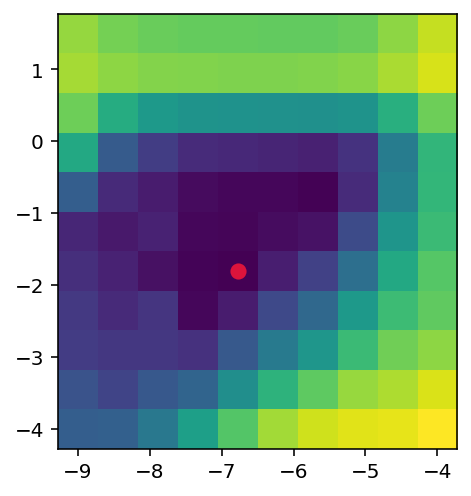

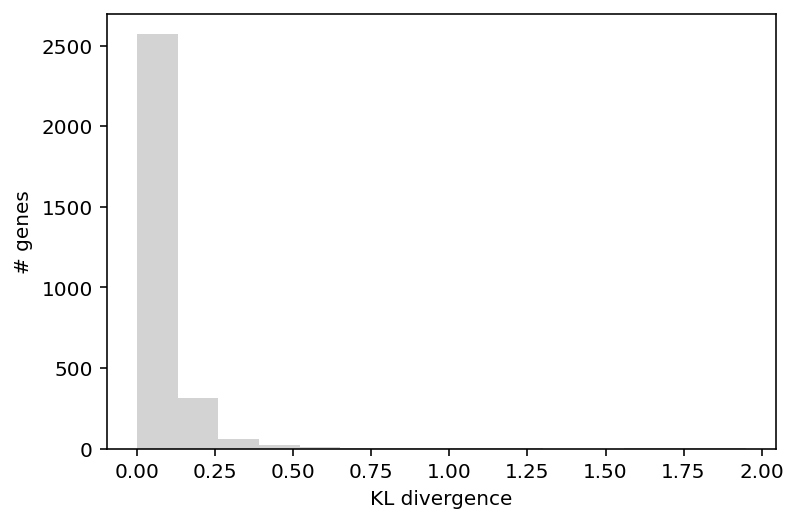

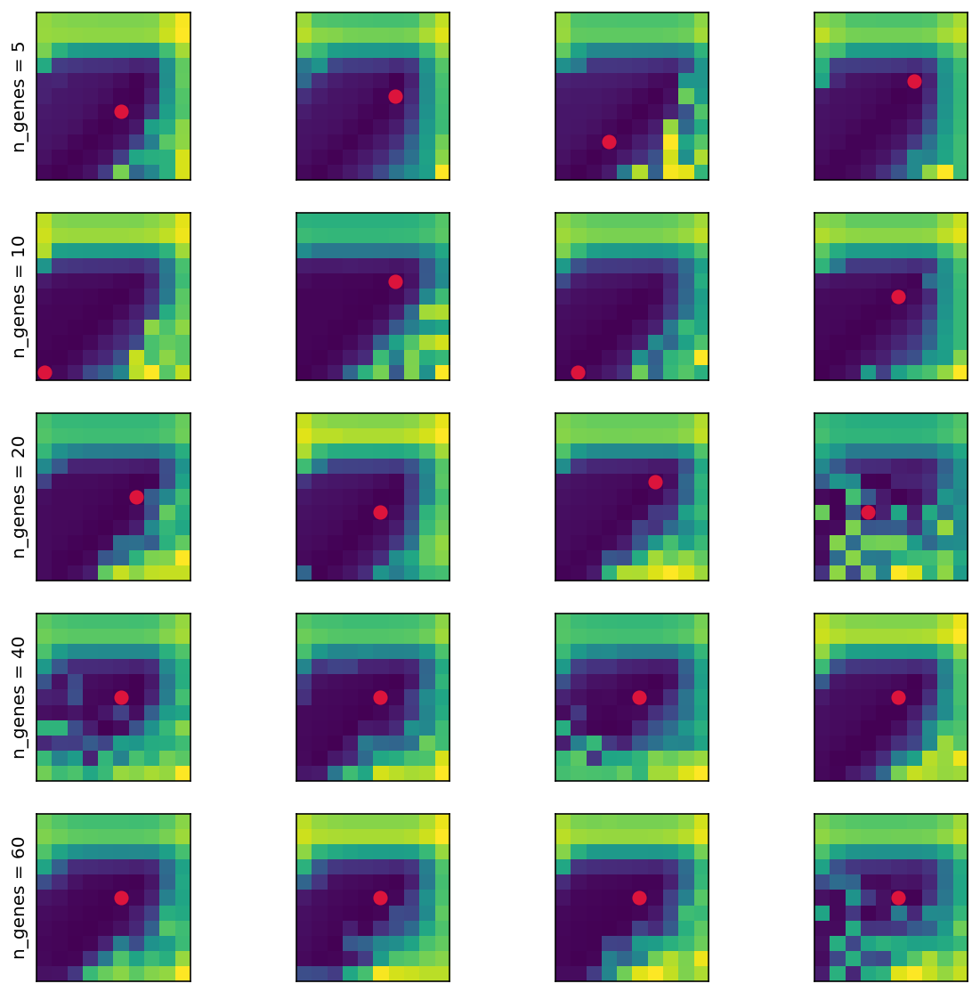

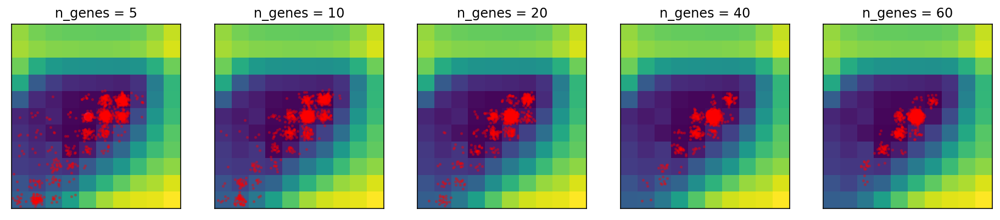

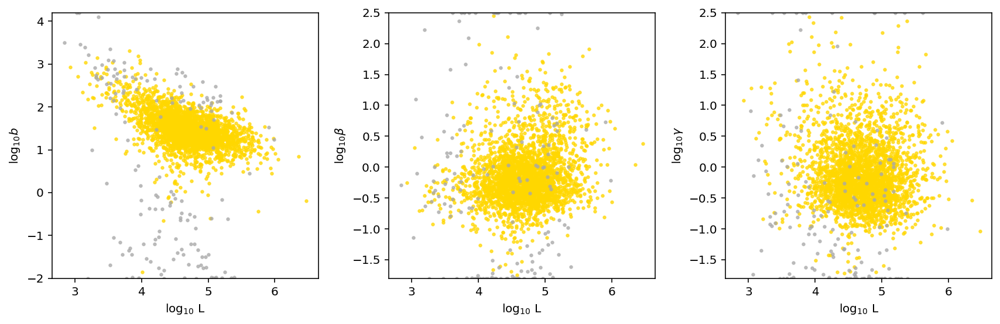

...

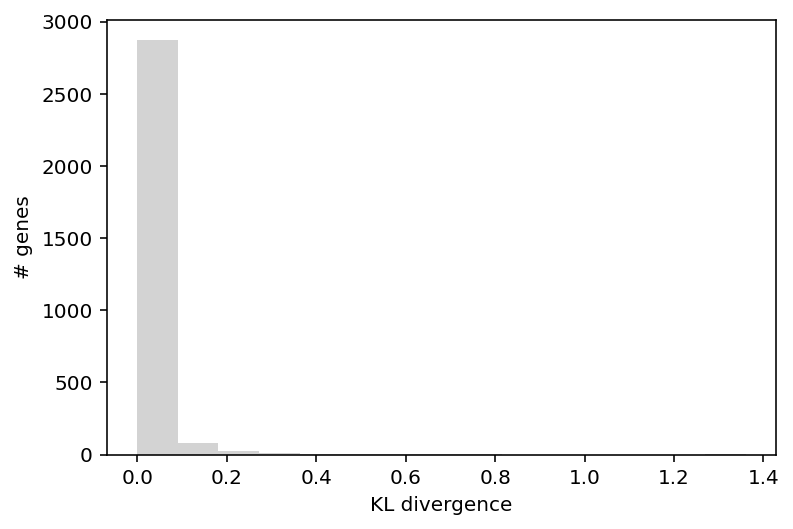

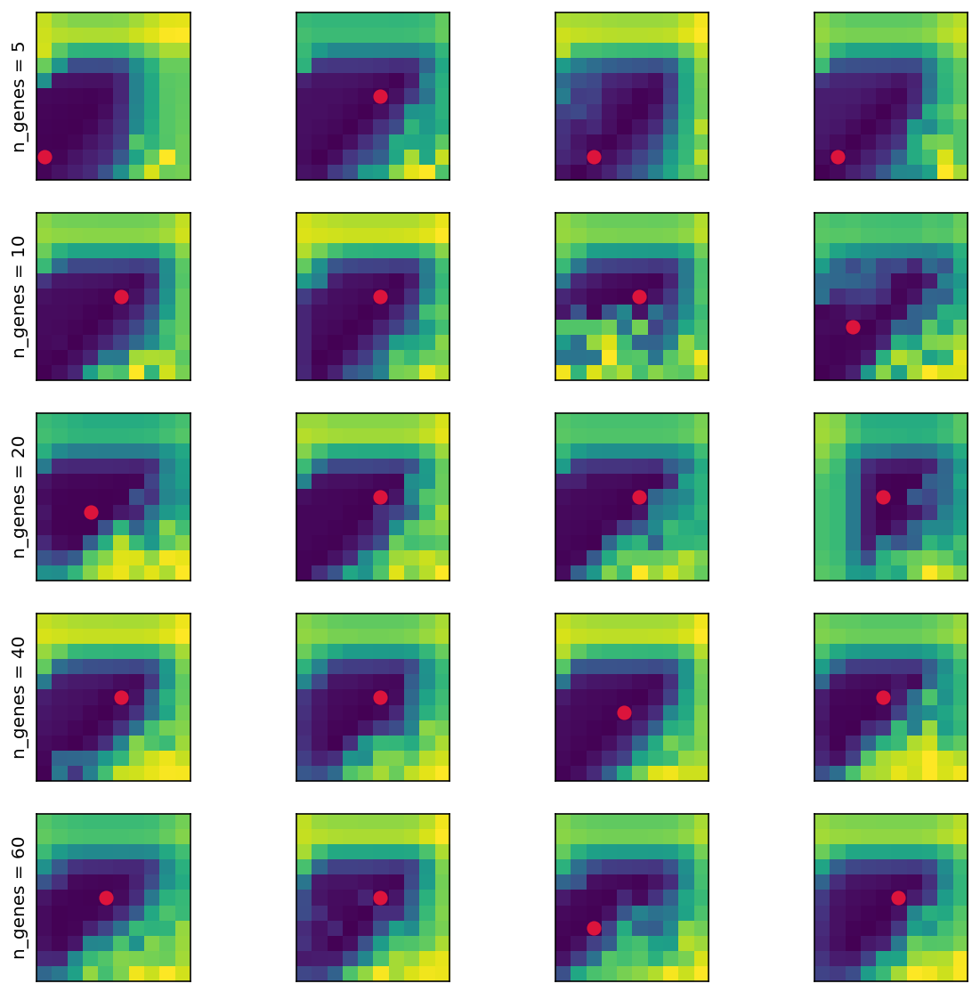

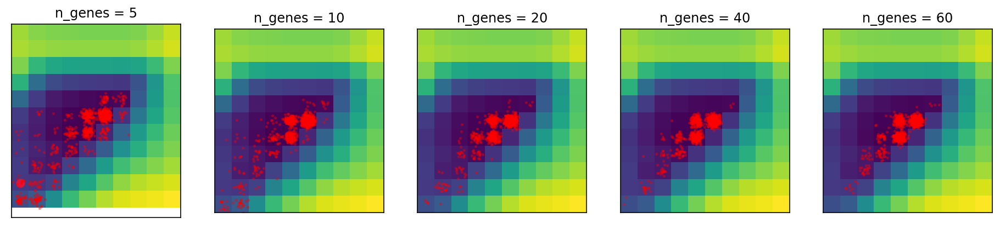

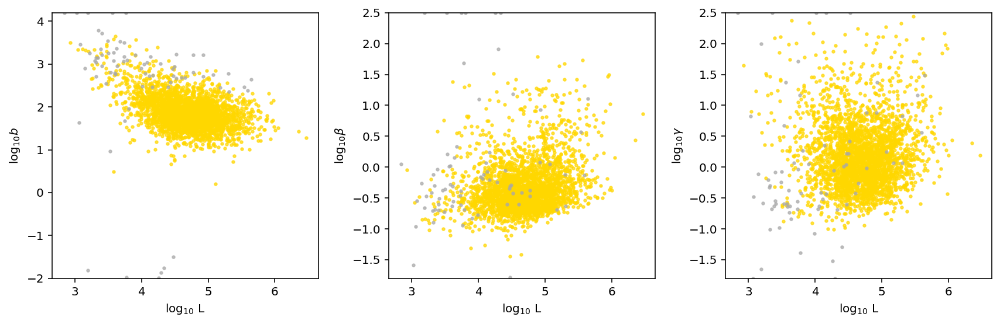

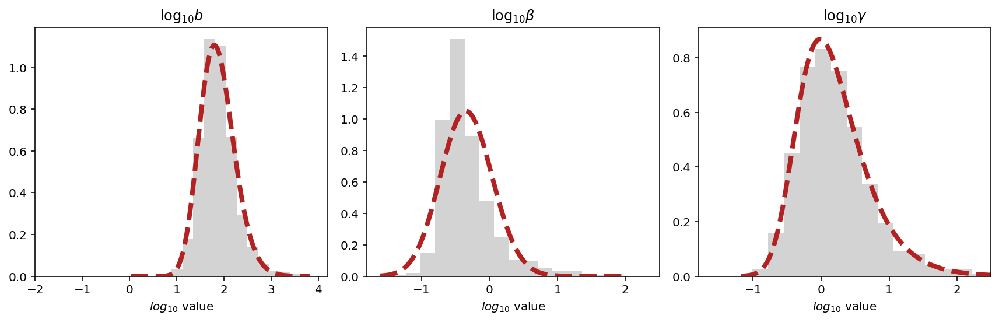

In [230]:
#Run tests for gene rejection and uncertainty calcs (std error of params)
for i in range(n_datasets):
    sr = monod.analysis.load_search_results(result_strings[i])
    sd = monod.analysis.load_search_data(dir_string+'/'+dataset_names[i]+'/raw.sd')
    fig1,ax1 = plt.subplots(1,1)
    sr.find_sampling_optimum()
    sr.plot_landscape(ax1)

    fig1,ax1 = plt.subplots(1,1)
    sr.plot_KL(ax1)

    #sr.plot_gene_distributions(sd,marg='joint') #Rerun fits, and try uncommenting

    _=sr.chisquare_testing(sd,threshold=1e-3)
#     sr.resample_opt_viz()
#     sr.resample_opt_mc_viz()
    sr.chisq_best_param_correction(sd,Ntries=4,viz=False,threshold=1e-3) 

    sr.compute_sigma(sd,num_cores=30) #Compute std error for parameters
    sr.plot_param_L_dep(plot_errorbars=False,plot_fit=True)
    sr.plot_param_marg()
    
    monod.analysis.make_batch_analysis_dir([sr],dir_string)
    sr.update_on_disk()
    

In [22]:
#Read back in results
sr_arr = [monod.analysis.load_search_results(r[:-4]+'_upd.res') for r in result_strings]

INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/Bursty_Poisson_10x11/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_10x11/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_O_E16/Bursty_Poisson_10x11/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_T_E16/Bursty_Poisson_10x11/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_O_E12/Bursty_Poisson_10x11/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_T_E12/Bursty_Poisson_10x11/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170726_T_E13/Bursty_Poisson_10x1

In [23]:
for i in range(len(sr_arr)):
    sr = sr_arr[i]
    print(str(i)+': '+dataset_names[i])
    print(str(i)+': '+str(sr.samp_optimum))
    print()

0: germ_allconds_170313_O_E16
0: (-6.777777777777778, -1.7999999999999998)

1: germ_allconds_170313_T_E16
1: (-5.666666666666666, -0.6999999999999997)

2: germ_allconds_170712_O_E16
2: (-5.666666666666666, -0.6999999999999997)

3: germ_allconds_170712_T_E16
3: (-6.777777777777778, -0.6999999999999997)

4: germ_allconds_170724_O_E12
4: (-6.222222222222222, -1.25)

5: germ_allconds_170724_T_E12
5: (-6.777777777777778, -1.7999999999999998)

6: germ_allconds_170726_T_E13
6: (-6.777777777777778, -1.25)

7: germ_allconds_170802_T_E13
7: (-6.222222222222222, -0.6999999999999997)

8: germ_allconds_170814_AGPF_E11
8: (-6.222222222222222, -0.6999999999999997)

9: germ_allconds_170814_AGPM_E11
9: (-6.777777777777778, -1.25)

10: germ_allconds_170816_O_E12
10: (-7.333333333333333, -1.7999999999999998)

11: germ_allconds_170816_T_E12
11: (-6.777777777777778, -1.25)

12: germ_allconds_170823_AGPF_E11
12: (-6.777777777777778, -0.6999999999999997)

13: germ_allconds_170823_AGPM_E11
13: (-6.22222222222

(-6.777777777777778, -1.7999999999999998)
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.
(-5.666666666666666, -0.6999999999999997)
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.
(-5.666666666666666, -0.6999999999999997)
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_O_E16/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.
(-6.777777777777778, -0.6999999999999997)
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_T_E16/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.
(-6.222222222222222, -1.25)
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_O_E12/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.
(-6.777777777777778, -1.7999999999999998)
INFO:root:Figure stored to 

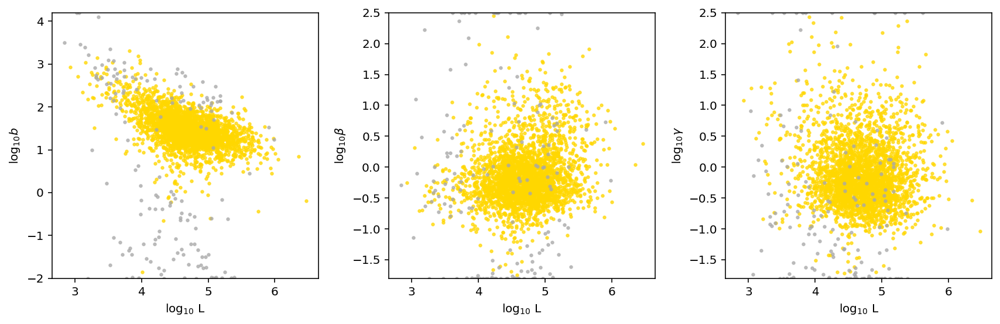

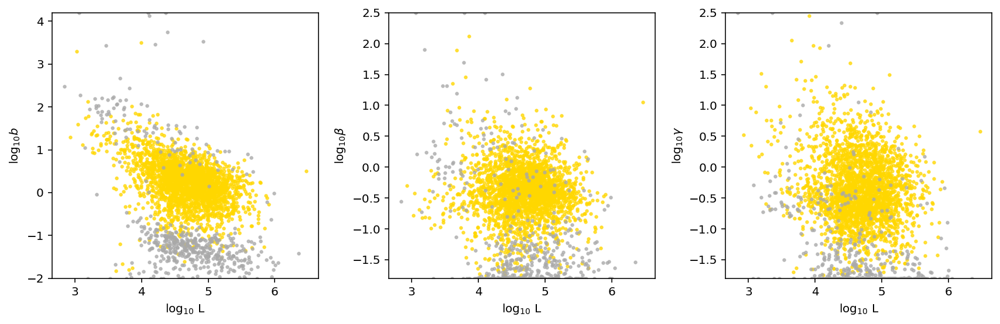

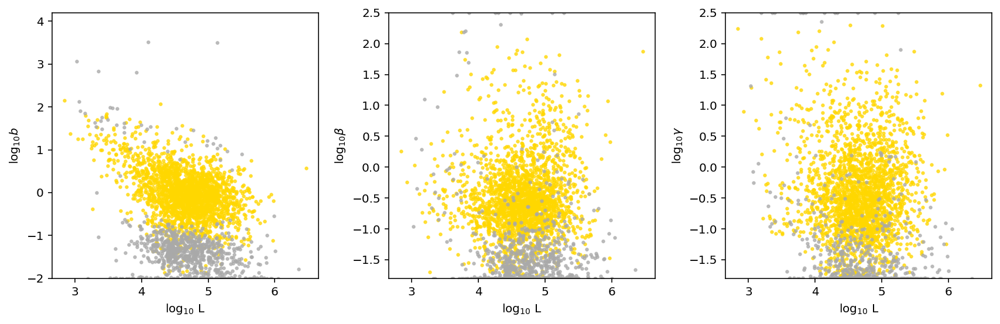

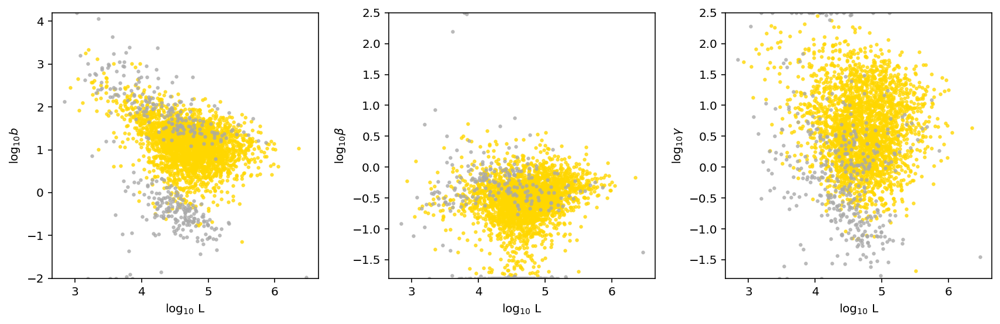

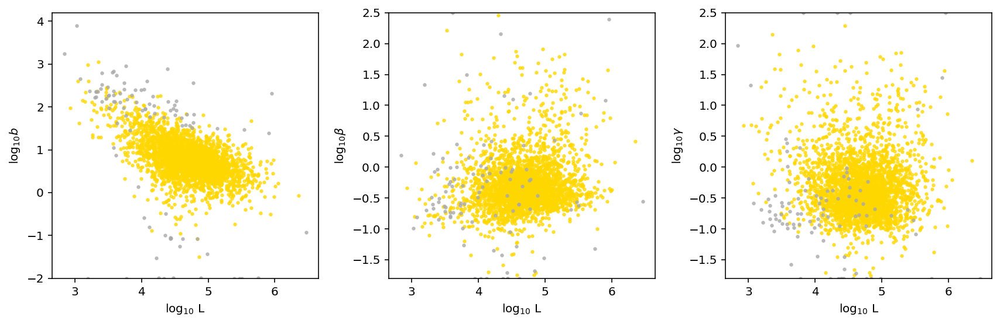

...

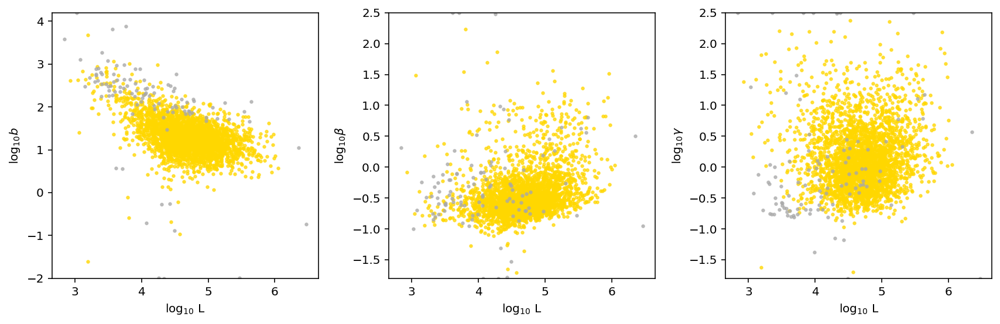

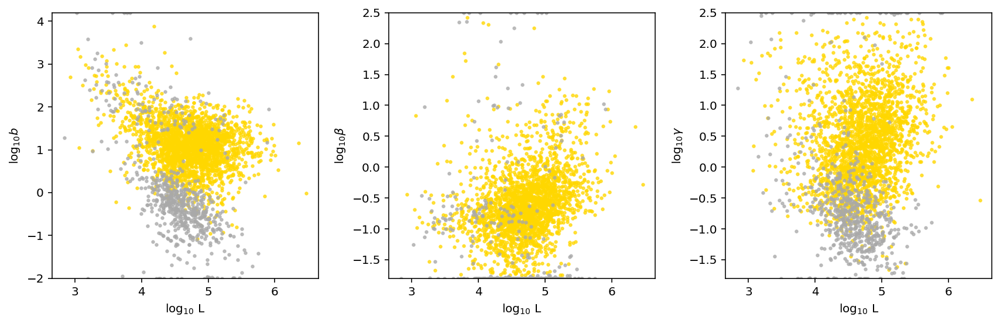

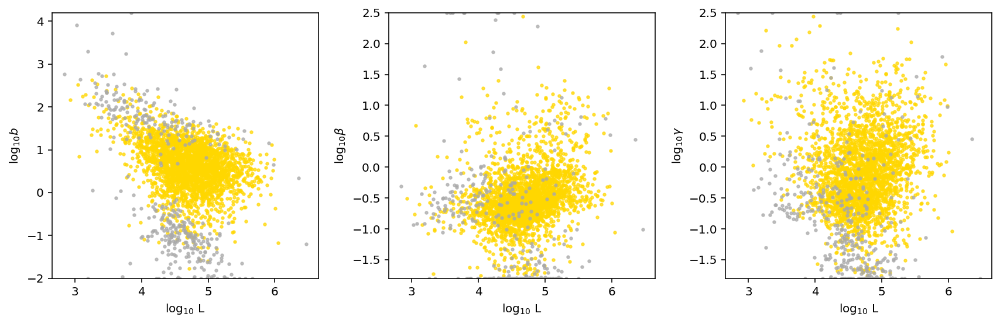

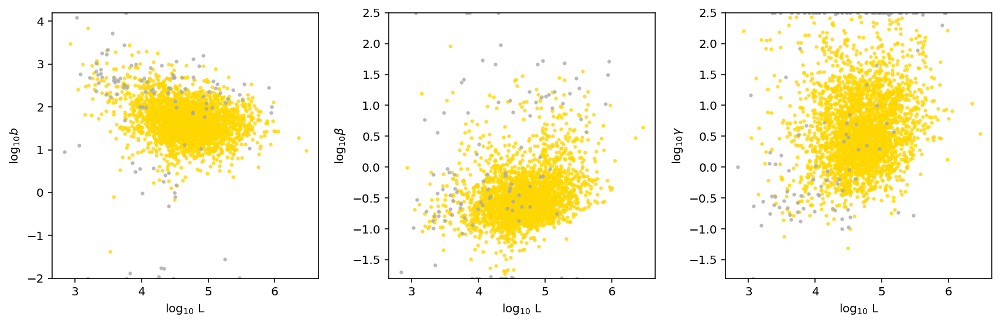

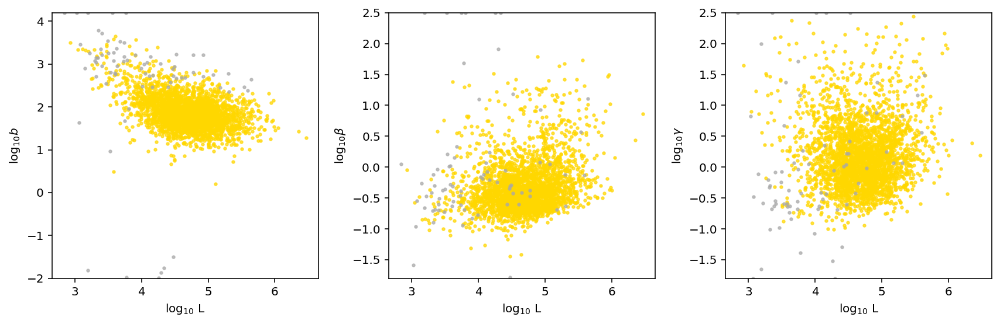

In [233]:
#See parameter fits per dataset
opt=[]
n_cells = []
for sr in sr_arr:
    y = sr.samp_optimum
    print(y)
    opt.append(y)
    n_cells.append(sr.n_cells)
    sr.plot_param_L_dep(plot_errorbars=False,plot_fit=True)
opt = np.asarray(opt)
n_cells = np.asarray(n_cells)

INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/raw.sd.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/Bursty_Poisson_10x11/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/Bursty_Poisson_10x11/analysis_figures/subsampling_stability.png.
INFO:root:Original optimum: -6.78, -1.80.
INFO:root:Chi-square computation complete. Rejected 157 genes out of 3000. Runtime: 5.5 seconds.
INFO:root:New optimum: -6.78, -1.80.
INFO:root:Chi-square computation complete. Rejected 157 genes out of 3000. Runtime: 5.4 seconds.
INFO:root:New optimum: -6.78, -1.80.
INFO:root:Chi-square computation complete. Rejected 157 genes out of 3000. Runtime: 5.4 seconds.
INFO:root:New optimum: -6.78, -1.80.
INFO:root:Chi-square computation complete. Rejected 157 genes out of 3000. Runtime: 5.4 seconds.
INFO:root:New optimum: -6.78, -1.80.
INFO:root:Chi-square computat

/home/tchari/monod/src/monod/inference.py:1453: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig1, ax1 = plt.subplots(nrows=1, ncols=Nsamp, figsize=figsize)


INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170726_T_E13/Bursty_Poisson_10x11/analysis_figures/subsampling_stability.png.
INFO:root:Original optimum: -6.78, -1.25.
INFO:root:Chi-square computation complete. Rejected 63 genes out of 3000. Runtime: 8.2 seconds.
INFO:root:New optimum: -6.78, -1.25.
INFO:root:Chi-square computation complete. Rejected 63 genes out of 3000. Runtime: 8.1 seconds.
INFO:root:New optimum: -6.78, -1.25.
INFO:root:Chi-square computation complete. Rejected 63 genes out of 3000. Runtime: 8.1 seconds.
INFO:root:New optimum: -6.78, -1.25.
INFO:root:Chi-square computation complete. Rejected 63 genes out of 3000. Runtime: 8.1 seconds.
INFO:root:New optimum: -6.78, -1.25.
INFO:root:Chi-square computation complete. Rejected 63 genes out of 3000. Runtime: 8.1 seconds.
INFO:root:Optimum retained at -6.78, -1.25.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170802_T_E13/raw.sd.
INFO:root:Figure stored to ./fits/

INFO:root:New optimum: -6.22, -0.70.
INFO:root:Chi-square computation complete. Rejected 378 genes out of 3000. Runtime: 6.7 seconds.
INFO:root:New optimum: -6.22, -0.70.
INFO:root:Chi-square computation complete. Rejected 378 genes out of 3000. Runtime: 6.6 seconds.
INFO:root:New optimum: -6.22, -0.70.
INFO:root:Chi-square computation complete. Rejected 378 genes out of 3000. Runtime: 6.6 seconds.
INFO:root:Optimum retained at -6.22, -0.70.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_180222_O_E13/raw.sd.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_180222_O_E13/Bursty_Poisson_10x11/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_180222_O_E13/Bursty_Poisson_10x11/analysis_figures/subsampling_stability.png.
INFO:root:Original optimum: -7.33, -1.25.
INFO:root:Chi-square computation complete. Rejected 107 genes out of 3000. Runtime: 7.3 seconds.
INFO:root:New optimum:

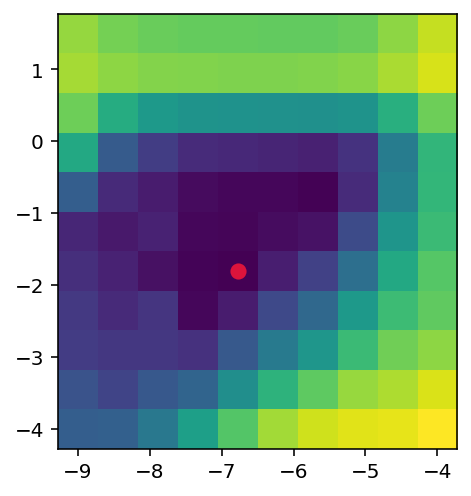

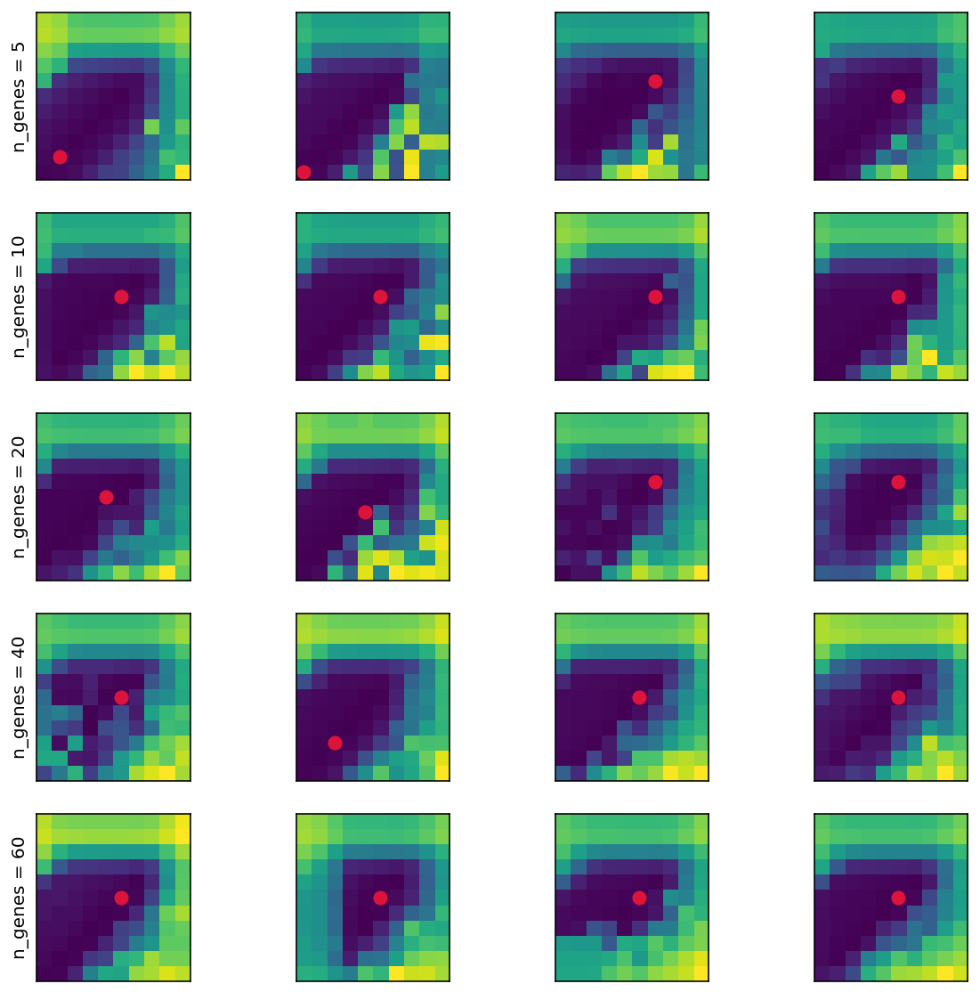

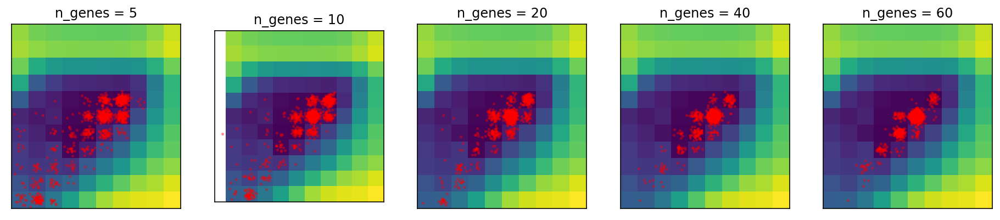

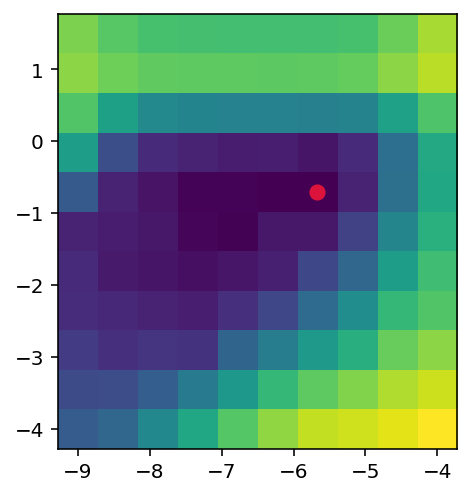

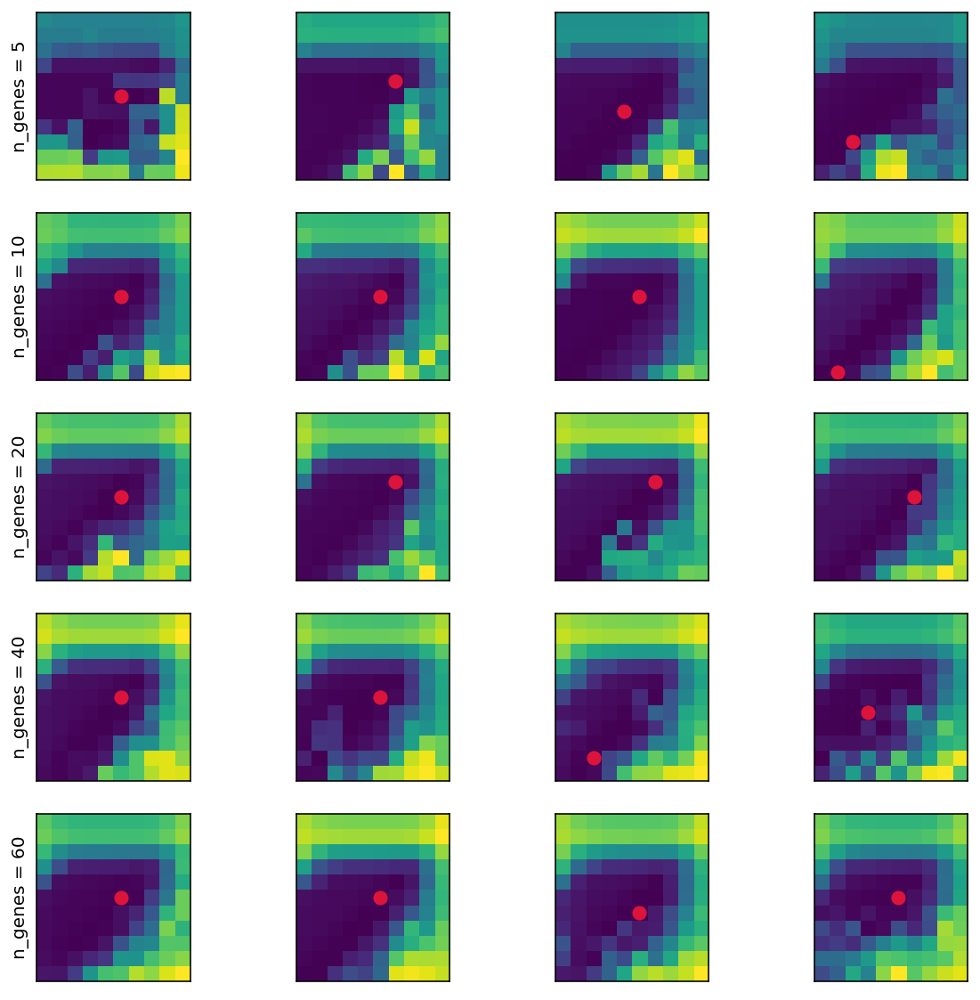

...

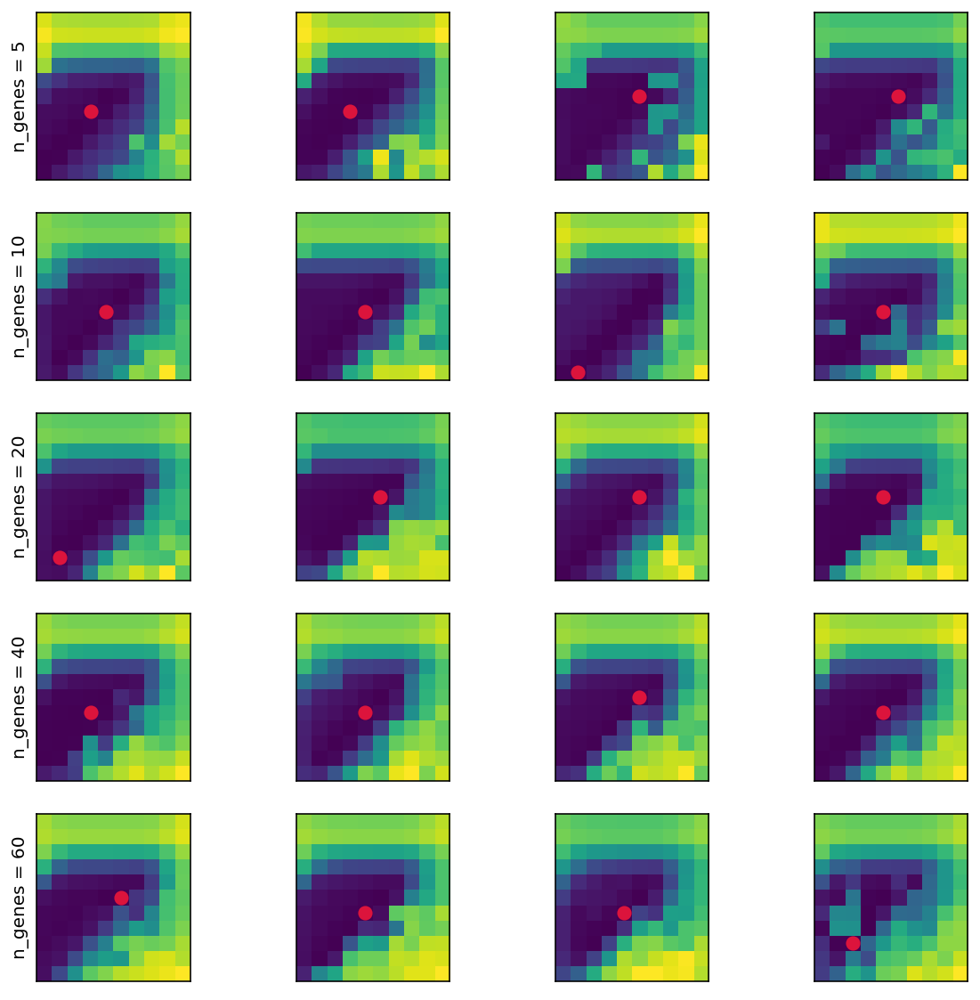

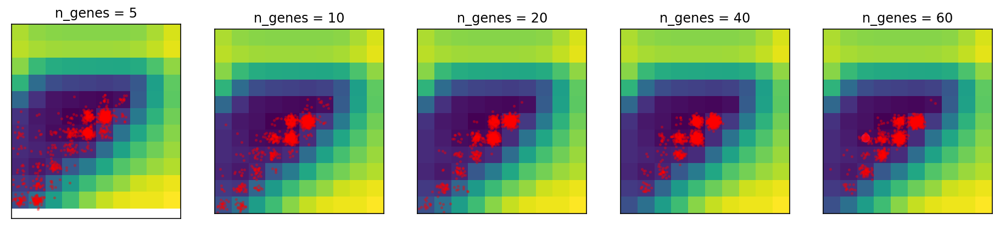

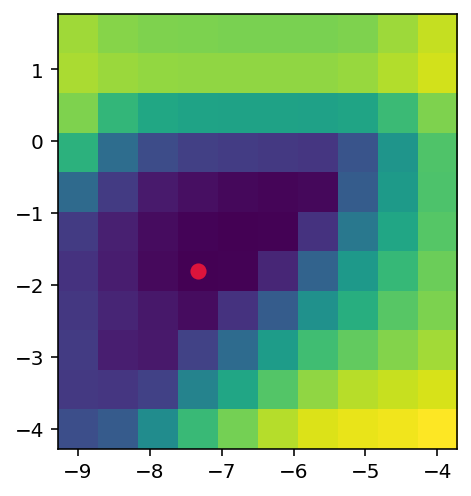

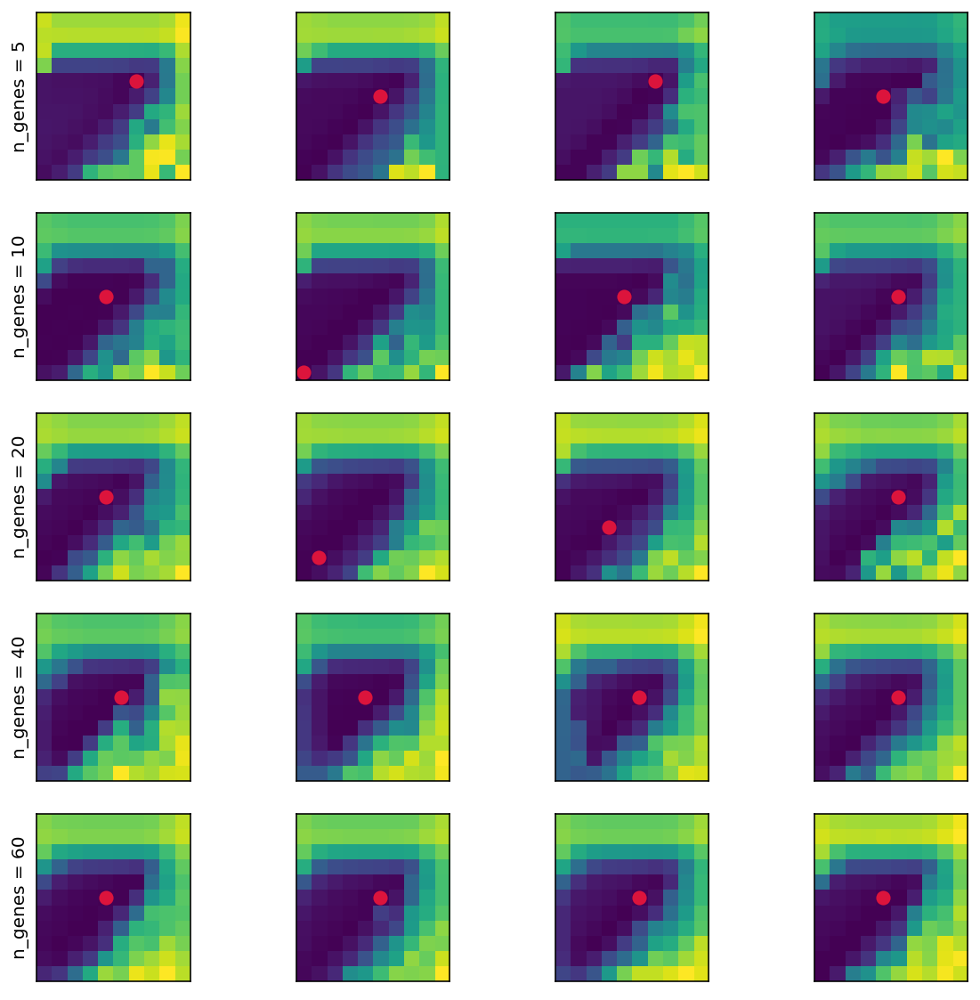

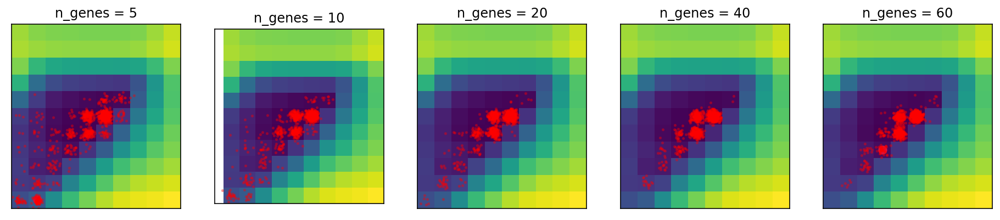

In [234]:
# for i in range(len(dataset_names)):
#     sr = sr_arr[i]
#     sd = monod.analysis.load_search_data(dir_string+'/'+dataset_names[i]+'/raw.sd')
#     fig1,ax1 = plt.subplots(1,1)
#     sr.plot_landscape(ax1)
    
#     sr.resample_opt_viz()
#     sr.resample_opt_mc_viz()
#     sr.chisq_best_param_correction(sd,Ntries=4,viz=False,threshold=1e-3) 

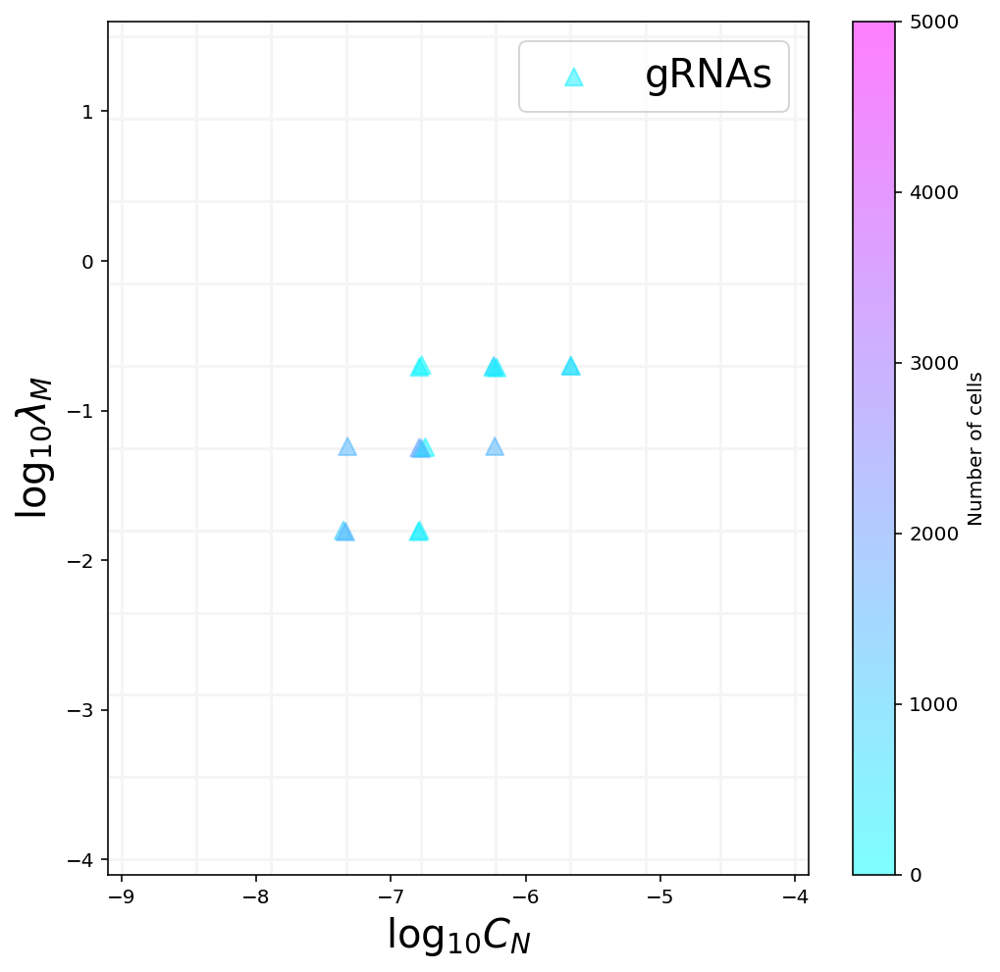

In [235]:
#plot technical parameters for each stage (they were sequenced separately)
xl = np.asarray([sr.sp.samp_lb[0],sr.sp.samp_ub[0]])
yl = np.asarray([sr.sp.samp_lb[1],sr.sp.samp_ub[1]])
x=np.linspace(xl[0],xl[1],sr.sp.gridsize[0])
y=np.linspace(yl[0],yl[1],sr.sp.gridsize[1])

fs = 20
d=0.1

fig1,ax1 = plt.subplots(1,1,figsize=(8,8))
for i in range(sr.sp.gridsize[0]):
    plt.plot([x[i]]*2,yl + [-d,d],c='whitesmoke')
for i in range(sr.sp.gridsize[1]):
    plt.plot(xl+ [-d,d],[y[i]]*2,c='whitesmoke')
jit = np.random.randn(n_datasets,2)*0.01
opt_ = opt+jit
cmap = 'cool'

# ctf = range(6,n_datasets)
# plt.scatter(opt_[ctf,0],opt_[ctf,1],100,n_cells[ctf],zorder=1000,
#             alpha=0.3,cmap=cmap,label='Cell types',vmin=0,vmax=5000)

stf = range(n_datasets) #-1 to exclude combo control

plt.scatter(opt_[stf,0],opt_[stf,1],80,n_cells[stf],marker='^',zorder=1000,
            alpha=0.5,cmap=cmap,label='gRNAs',vmin=0,vmax=5000)
plt.xlim(xl+ [-d,d])
plt.ylim(yl+ [-d,d])

plt.legend(fontsize=fs,loc='upper right')
plt.colorbar(label='Number of cells')

plt.xlabel(r'$\log_{10} C_N$',fontsize=fs)
plt.ylabel(r'$\log_{10} \lambda_M$',fontsize=fs)

fig_string = sr.batch_analysis_string+'/landscape_qc.png'
plt.savefig(fig_string,dpi=450)